# Some models:

## A OLS regression model

 - $$y_{it} = \alpha_i + \beta x_{it} + \gamma z_{it} + \delta_t + \epsilon_{it}$$
 
## A system dynamics model

 - 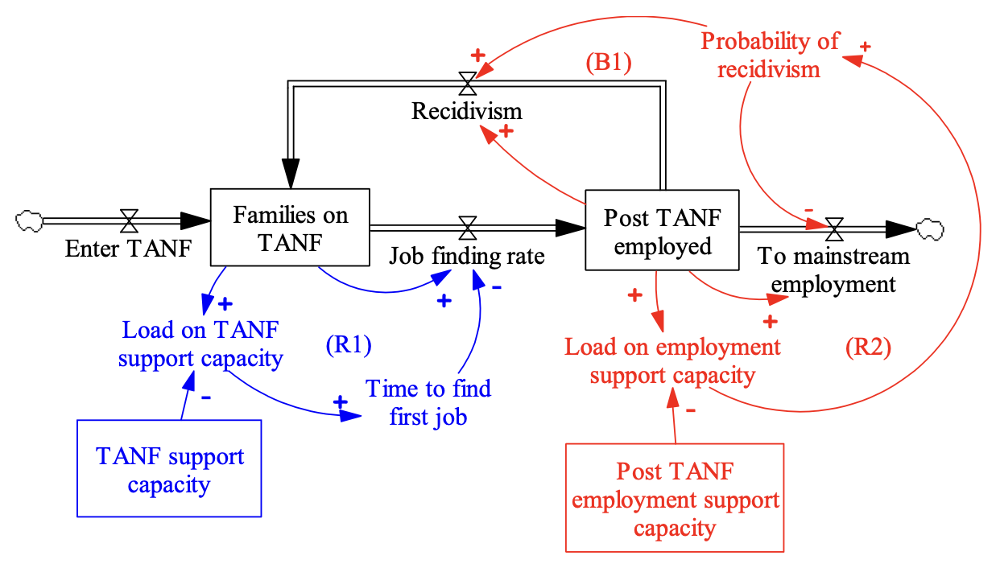
 
## A hidden layer neural network

 - 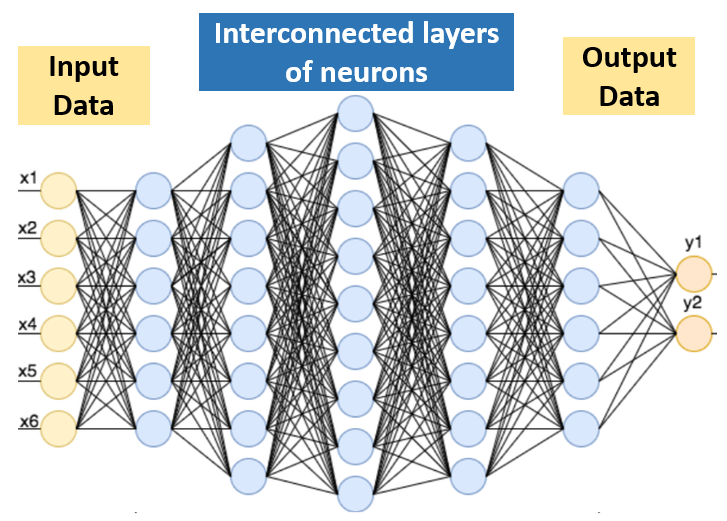

# Commonalities

All trying to "fit" some data: have empirical parameters to be calibrated:
$$\vec{y} = f(\vec{x} | \vec{\beta})$$

Plenty of nuance here:
 - OLS requires an independent error term (= exogenous variables), while system dynamics doesn't believe in one.
 - Machine learning is based on cross-validation, often on the structure of the model itself.
 - Different theories ("data-generating processes") lead to fundamental differences in how $f$ is structured.

# Look at some data

In [1]:
data(faithful)

In [2]:
library(ggplot2)

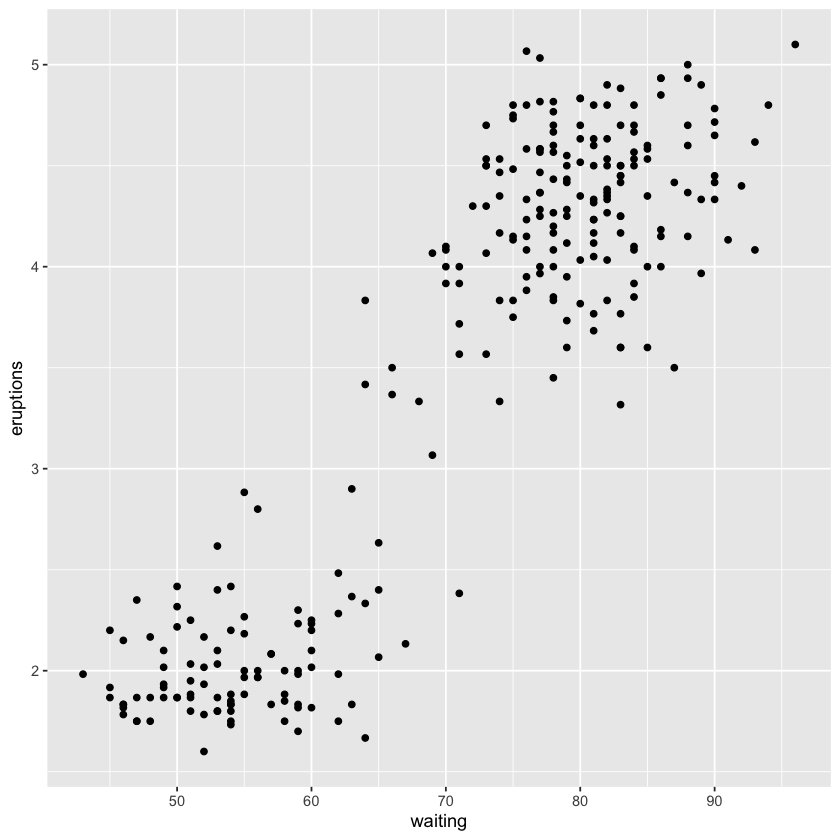

In [3]:
ggplot(faithful, aes(waiting, eruptions)) + 
  geom_point()

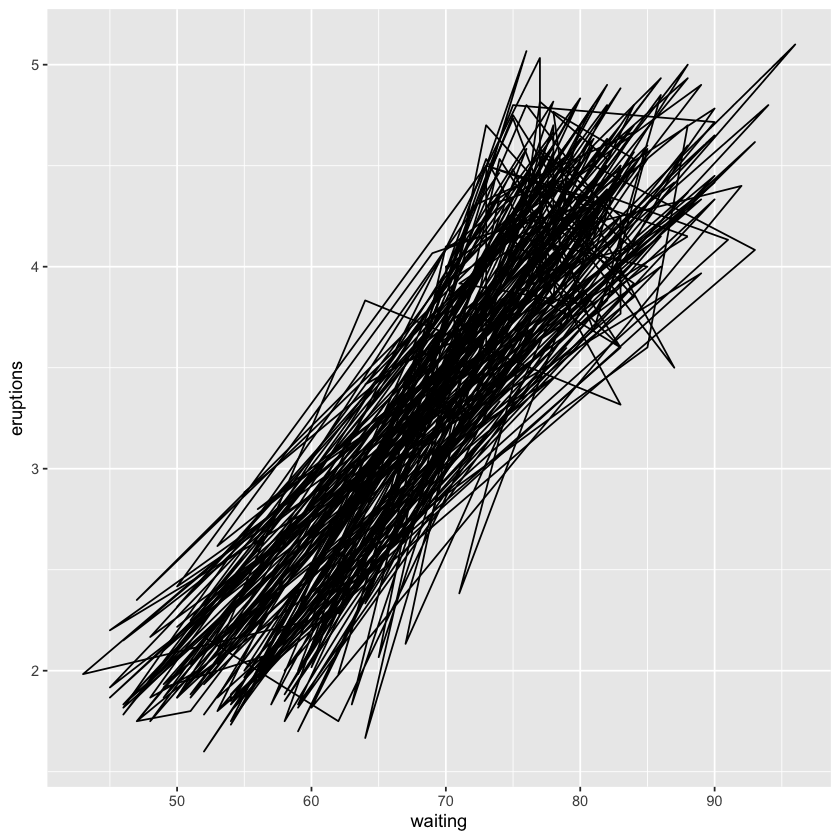

In [4]:
ggplot(faithful, aes(waiting, eruptions)) + 
  geom_path()

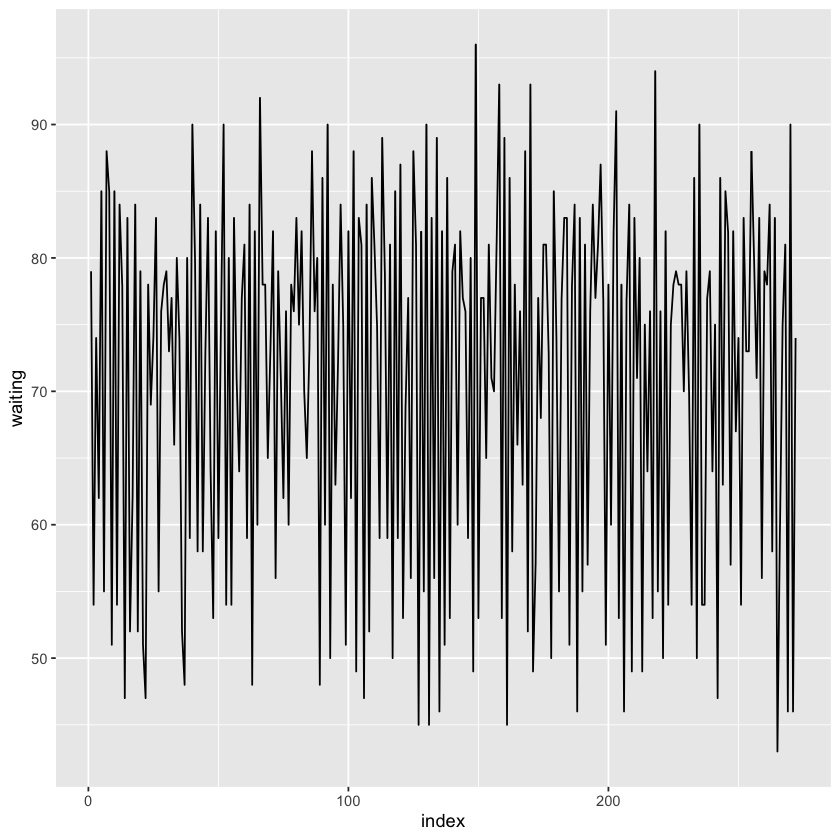

In [5]:
faithful$index = 1:nrow(faithful)
ggplot(faithful, aes(index, waiting)) + 
  geom_line()

## Connecting parameter fit with optimization

We can see that our data is roughly sinusoidal, so it has the form $A cos(f (t - d)) + B$. But what are the values of $A$, $f$, $d$ and $B$? To find the answer we need three things:

1. Our model: $A cos(f (t - d)) + B$
2. Our data: `waiting` vs. `index` above.
3. A "loss function": something that gets minimized when the parameters are correct.

R has a couple of easy-to-use functions that can fit be used to fit parameters in an arbitrary model: `optimize` and `optim`. `optimize` just optimizes 1 parameter, while `optim` handles any number.

## Case 1: A single value

Let's just try to determine the mean of the data. What should the loss function look like?

In [6]:
lossfunc = function(BB) {
    sum((faithful$waiting - BB)^2)
}

In [8]:
optimize(lossfunc, c(0, 100))

$minimum
[1] 70.89706

$objective
[1] 50087.12

In [9]:
mean(faithful$waiting)

[1] 70.89706

## Case 2: all four variables

In [151]:
tt = 1:100
df = data.frame(index=tt, waiting=3.2 * cos(0.23 * (tt - 1)) + 1.1)

In [152]:
model = function(AA, ff, dd, BB) {
    AA * cos(ff * (df$index - dd)) + BB
}

In [153]:
lossfunc = function(par) {
    sum((df$waiting - model(par[1], par[2], par[3], par[4]))^2)
}

In [154]:
optim(c(1, 1, 0, 0), lossfunc)

$par
[1] -0.1080320  1.0706116 -0.9553381  1.0072320

$value
[1] 524.0867

$counts
function gradient 
     369       NA 

$convergence
[1] 0

$message
NULL

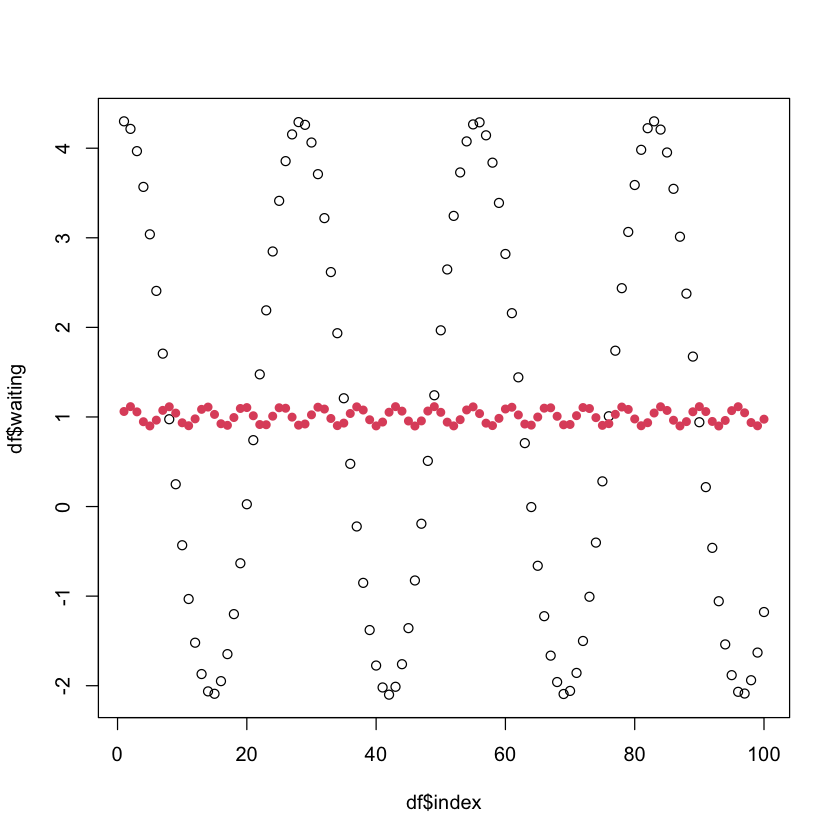

In [155]:
par = optim(c(1, 1, 0, 0), lossfunc)$par

plot(df$index, df$waiting, col=1)
points(df$index, model(par[1], par[2], par[3], par[4]), col=2, pch=16)

Let's help it out!

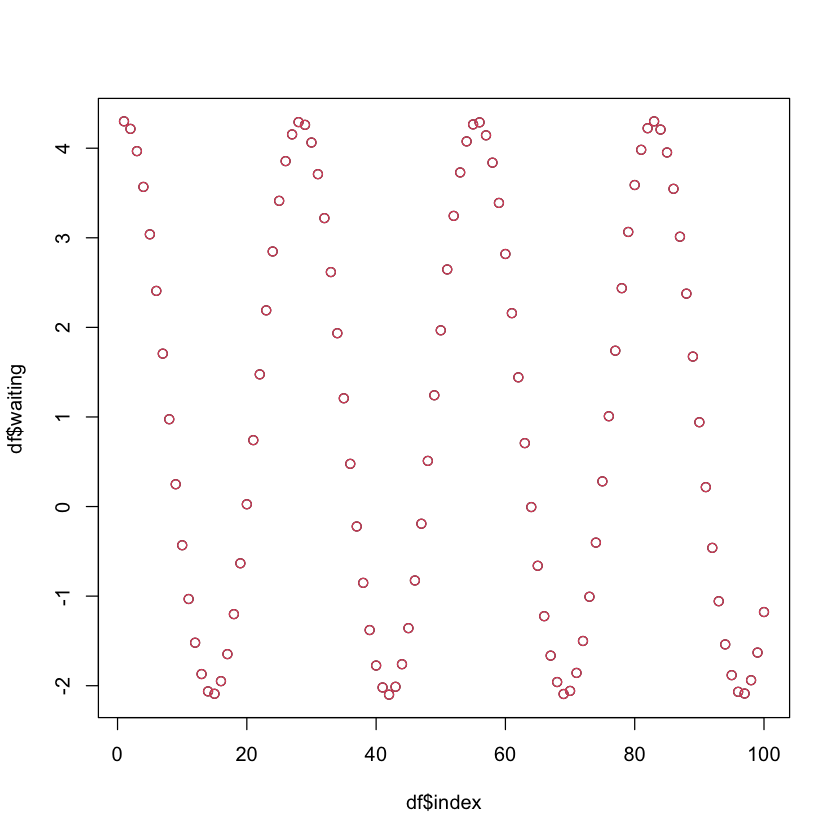

In [157]:
plot(df$index, df$waiting, col=1)
points(df$index, model(3.2, 0.23, 1, 1.1), col=2)

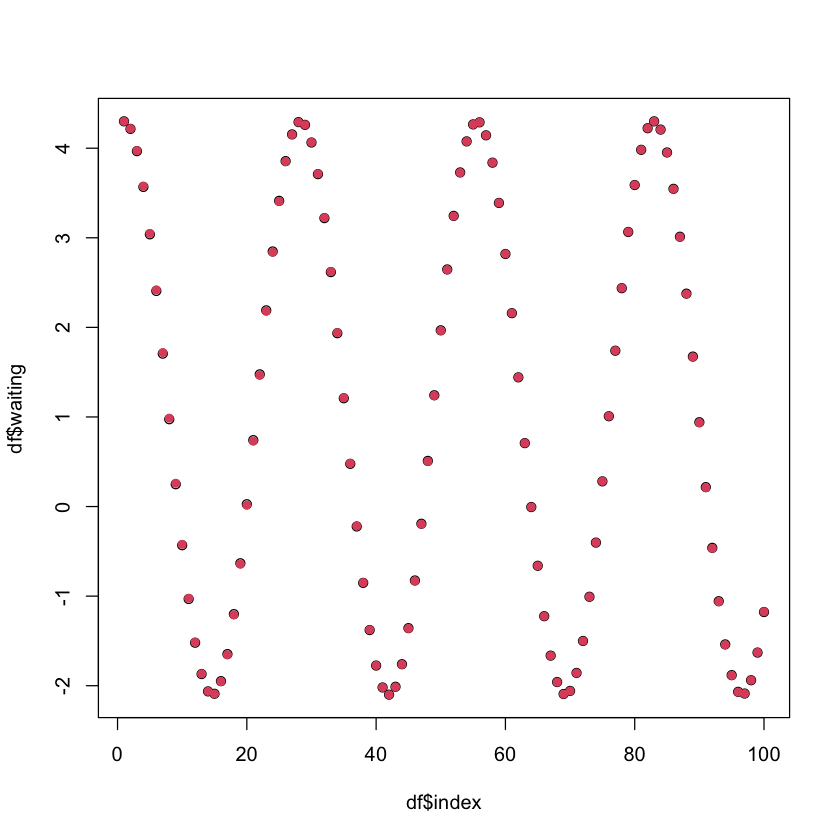

In [158]:
par = optim(c(3, 0, 1, 1), lossfunc)$par

plot(df$index, df$waiting, col=1)
points(df$index, model(par[1], par[2], par[3], par[4]), col=2, pch=16)

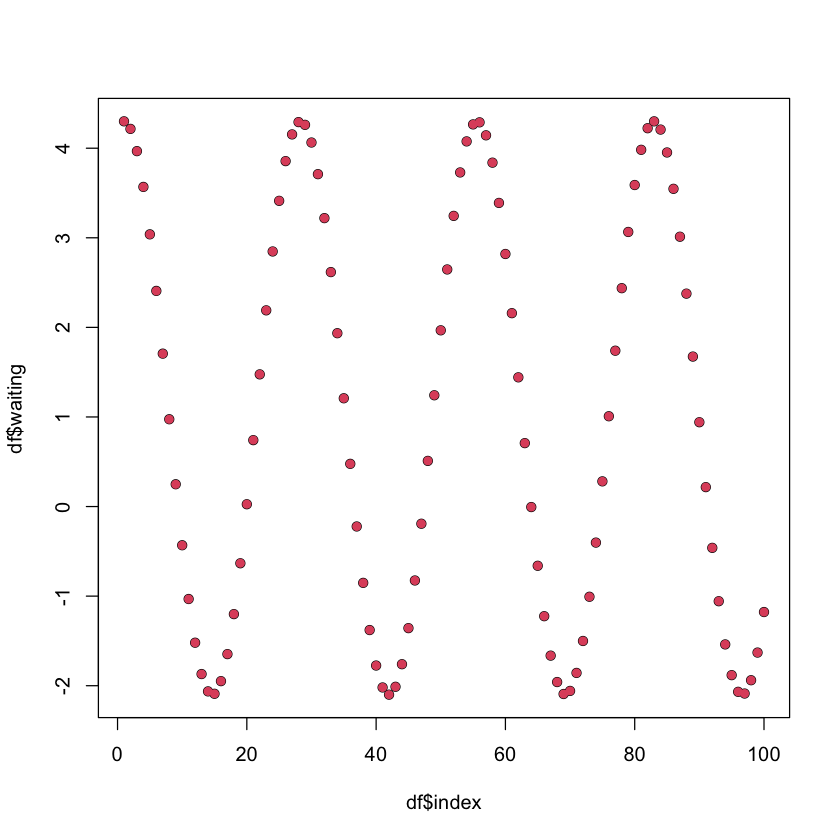

In [162]:
par = optim(c(3, 0, 0, 0), lossfunc)$par

plot(df$index, df$waiting, col=1)
points(df$index, model(par[1], par[2], par[3], par[4]), col=2, pch=16)

In [163]:
par

[1] 3.2001139 0.2299940 0.9984762 1.1001861

**How far away can we go and still get the answer?**

## Why does this happen?

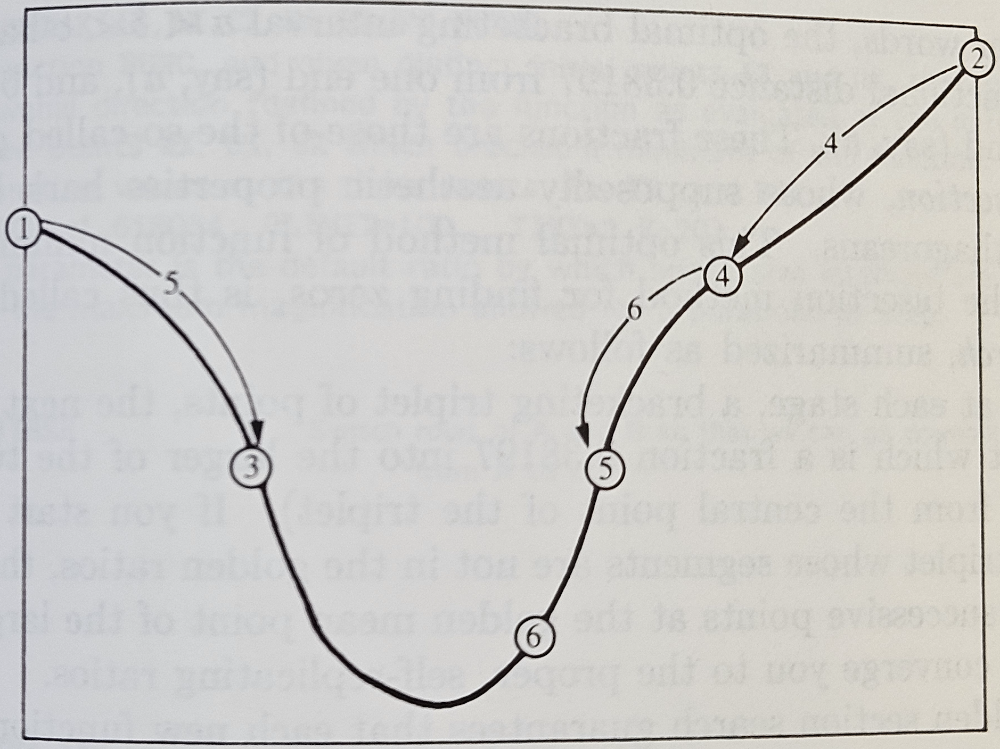
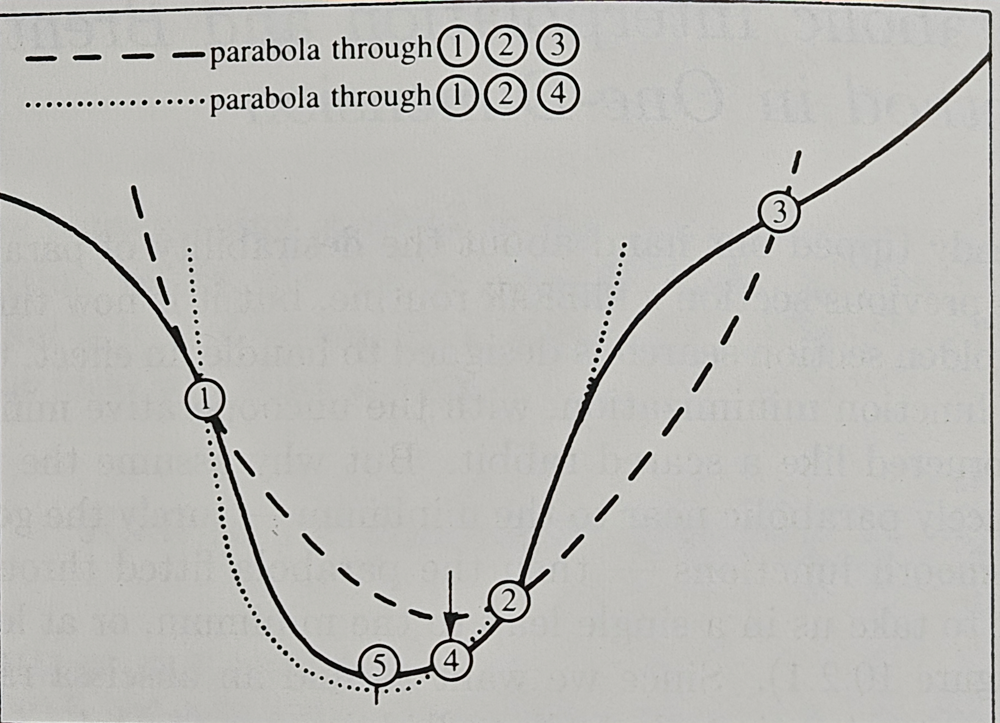

First, let's see if we can reproduce the problem with just 2 variables.

In [164]:
lossfunc = function(par) {
    sum((df$waiting - model(par[1], par[2], 1, 1.1))^2)
}

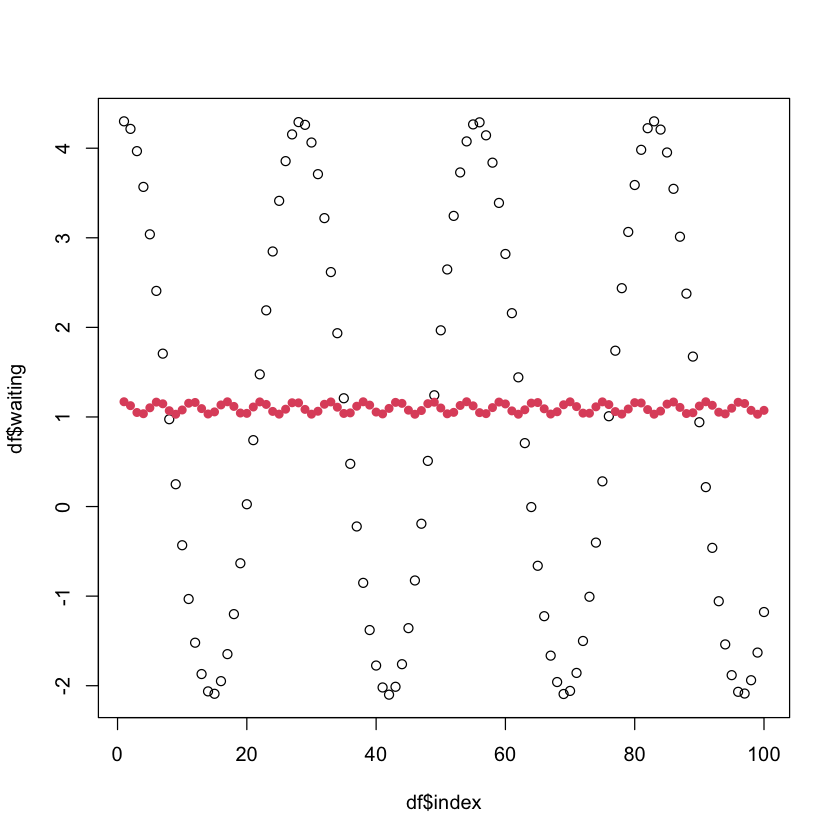

In [165]:
par = optim(c(1, 1), lossfunc)$par

plot(df$index, df$waiting, col=1)
points(df$index, model(par[1], par[2], 1, 1.1), col=2, pch=16)

In [178]:
grid = expand.grid(AA=seq(0, 10, length.out=100), ff=seq(0, 1, length.out=100))

In [179]:
grid$loss = sapply(1:nrow(grid), function(ii) lossfunc(c(grid$AA[ii], grid$ff[ii])))

In [180]:
library(tidyverse)

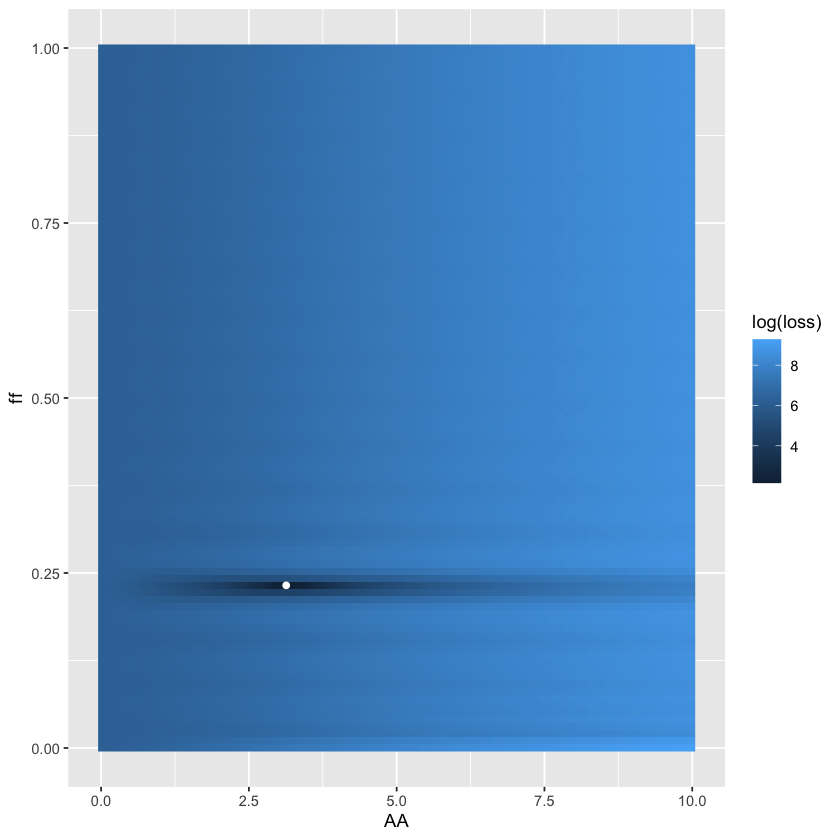

In [183]:
ggplot(grid, aes(AA, ff, fill=log(loss))) + geom_raster() + geom_point(data=grid[which.min(grid$loss),], col='white')

In [184]:
which.min(grid$loss)

[1] 2332

In [185]:
grid[2332,]

,AA,ff,loss
,<dbl>,<dbl>,<dbl>
2332,3.131313,0.2323232,8.633101


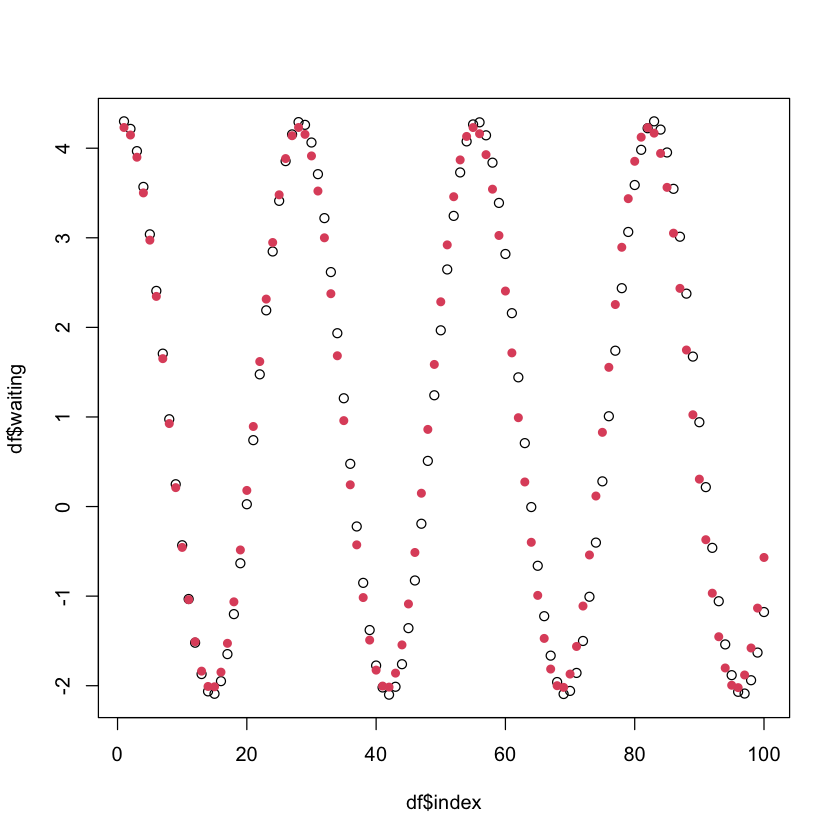

In [186]:
plot(df$index, df$waiting, col=1)
points(df$index, model(3.131313, 0.2323232, 1, 1.1), col=2, pch=16)

## Solution 1: Sample the whole space

## Solution 2: Random sampling

In [187]:
lossfunc = function(par) {
    sum((df$waiting - model(par[1], par[2], par[3], par[4]))^2)
}

In [188]:
par = c(runif(1, 0, 10), runif(1, 0, 1), runif(1, -.5, .5), runif(1, 0, 2))

In [189]:
lossfunc(par)

[1] 1042.271

In [190]:
nrow(grid)

[1] 10000

In [195]:
options = data.frame()
for (ii in 1:10000) {
    par = c(runif(1, 0, 10), runif(1, 0, 1), runif(1, -.5, .5), runif(1, 0, 2))
    loss = lossfunc(par)
    options = rbind(options, data.frame(AA=par[1], ff=par[2], dd=par[3], BB=par[4], loss=loss))
}

In [196]:
pdf = data.frame(index=1:10000, best=cummin(options$loss))

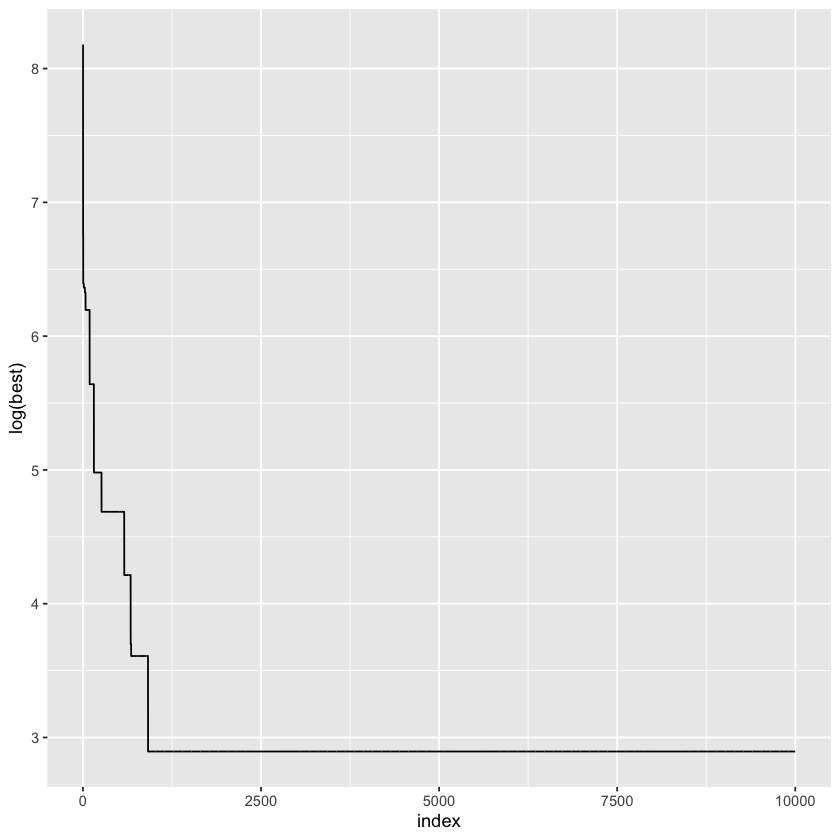

In [197]:
ggplot(pdf, aes(index, log(best))) + geom_line()

In [198]:
options[which.min(options$loss),]

,AA,ff,dd,BB,loss
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
914,3.704396,0.2270862,0.2410884,1.247104,18.08634


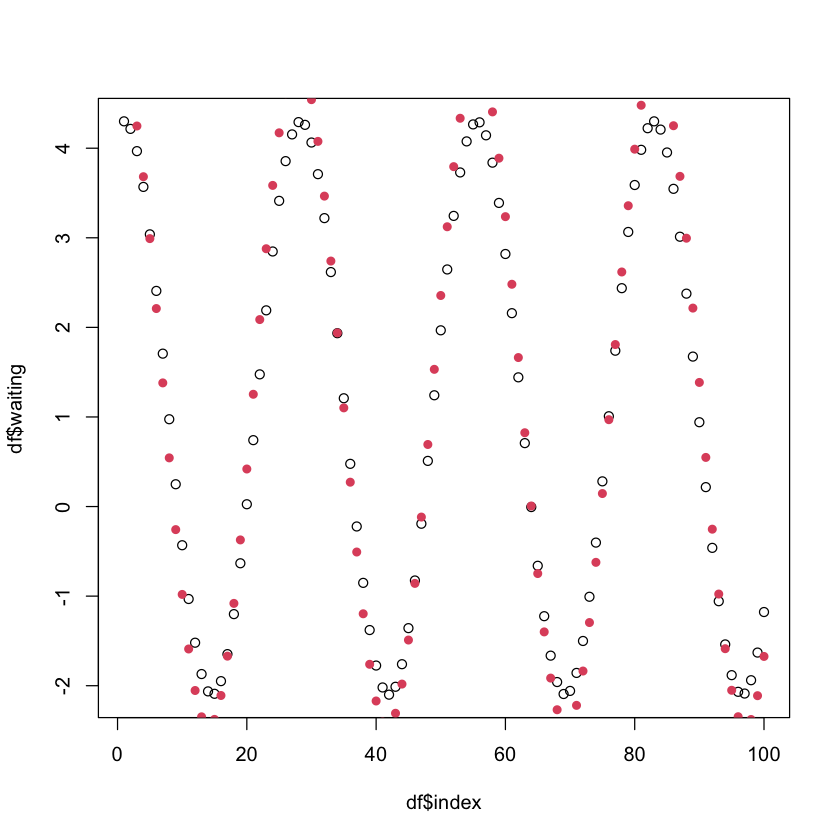

In [199]:
plot(df$index, df$waiting, col=1)
points(df$index, model(3.704396, 0.2270862, 0.2410884, 1.247104), col=2, pch=16)

## Solution 3: Random with gradient ascent

In [200]:
options = data.frame()
for (ii in 1:1000) {
    par0 = c(runif(1, 0, 10), runif(1, 0, 1), runif(1, -.5, .5), runif(1, 0, 2))
    par = optim(par0, lossfunc)$par
    loss = lossfunc(par)
    options = rbind(options, data.frame(AA=par[1], ff=par[2], dd=par[3], BB=par[4], loss=loss))
}

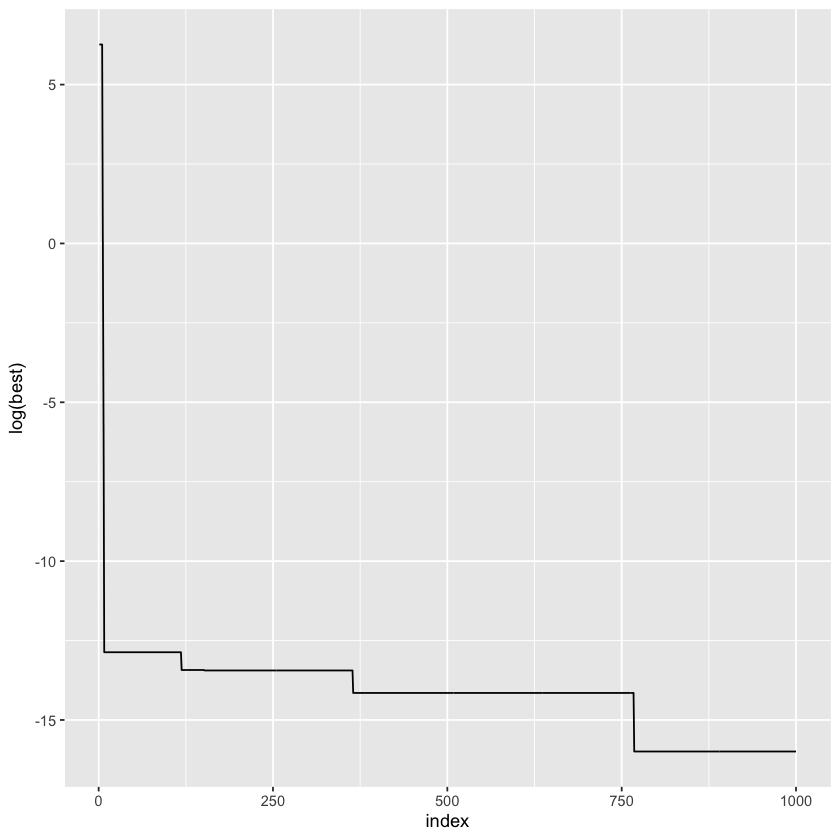

In [201]:
pdf = data.frame(index=1:1000, best=cummin(options$loss))
ggplot(pdf, aes(index, log(best))) + geom_line()

## Solutions not appearing in this practicum

* Specifics of gradient ascent (bracketing, Newton's method, Brent's method, Golden section search)
* Genetic algorithms
* Simulated annealing

## Solution 2: Linearize with feedback

Sinusoids are the result of feedback. That means that we should be able to write something like:
$$y_t = \alpha + \beta y_{t-1}$$

Let's try it!

In [203]:
model = function(aa, bb, y1) {
    yys = y1
    yprev = y1
    for (ii in 2:nrow(df)) {
        yprev = aa + bb * yprev
        yys[ii] = yprev
    }
    yys
}

NOTE: We need to use `tidyverse` here: it defines a more sensible `lag` function.

In [204]:
summary(lm(waiting ~ lag(waiting, 1), data=df))


Call:
lm(formula = waiting ~ lag(waiting, 1), data = df)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.67202 -0.49335 -0.05901  0.47798  0.78693 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
(Intercept)     -0.02371    0.05628  -0.421    0.674    
lag(waiting, 1)  0.96929    0.02240  43.263   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5108 on 97 degrees of freedom
  (1 observation deleted due to missingness)
Multiple R-squared:  0.9507,	Adjusted R-squared:  0.9502 
F-statistic:  1872 on 1 and 97 DF,  p-value: < 2.2e-16


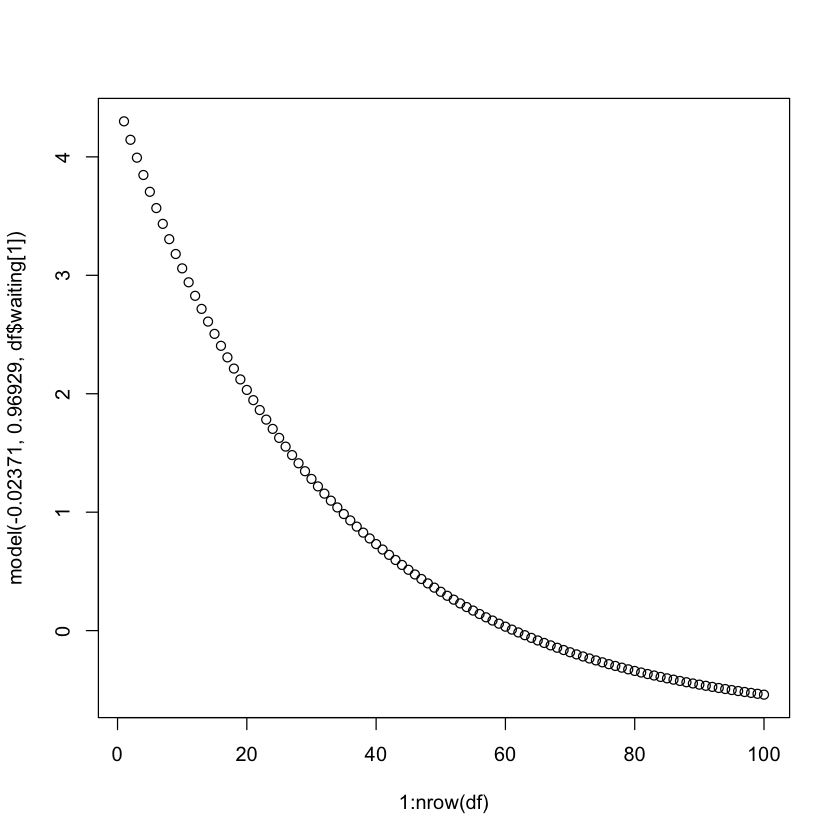

In [206]:
plot(1:nrow(df), model(-0.02371, 0.96929, df$waiting[1]))

Let's try $$y_t = \alpha + \beta y_{t-1} + \gamma y_{t-2}$$

In [207]:
model = function(aa, bb, cc, y1, y2) {
    yys = c(y1, y2)
    for (ii in 3:nrow(df)) {
        yys[ii] = aa + bb * yys[ii-1] + cc * yys[ii-2]
    }
    yys
}

In [208]:
summary(lm(waiting ~ lag(waiting) + lag(waiting, 2), data=df))


Call:
lm(formula = waiting ~ lag(waiting) + lag(waiting, 2), data = df)

Residuals:
       Min         1Q     Median         3Q        Max 
-1.108e-14 -8.044e-16  4.560e-17  8.006e-16  1.083e-14 

Coefficients:
                  Estimate Std. Error    t value Pr(>|t|)    
(Intercept)      5.793e-02  3.236e-16  1.790e+14   <2e-16 ***
lag(waiting)     1.947e+00  5.794e-16  3.361e+15   <2e-16 ***
lag(waiting, 2) -1.000e+00  5.773e-16 -1.732e+15   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 2.904e-15 on 95 degrees of freedom
  (2 observations deleted due to missingness)
Multiple R-squared:      1,	Adjusted R-squared:      1 
F-statistic: 2.982e+31 on 2 and 95 DF,  p-value: < 2.2e-16


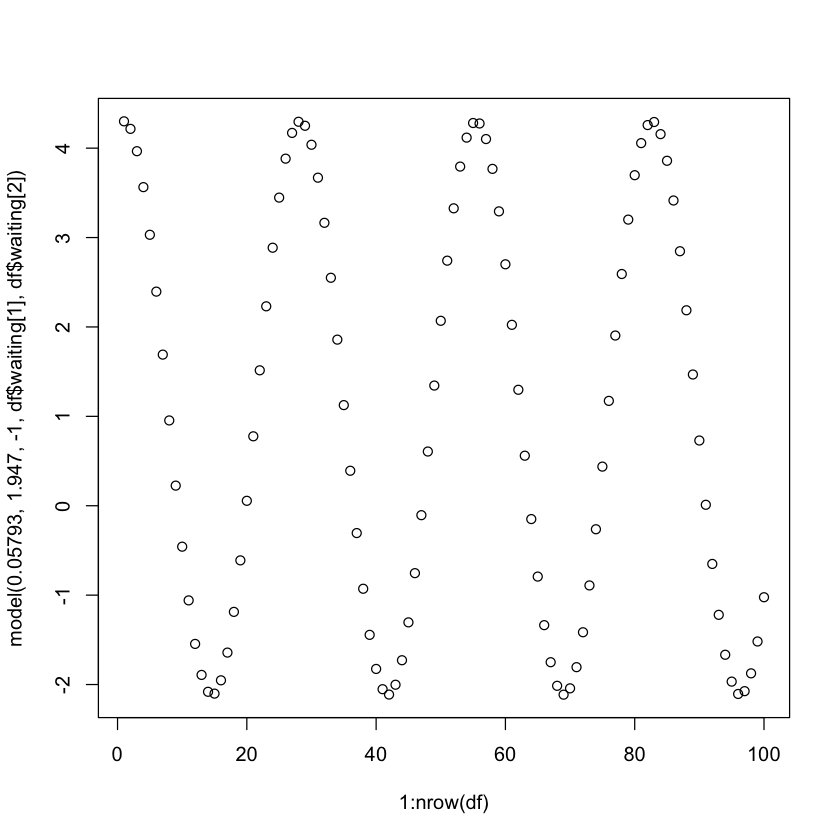

In [209]:
plot(1:nrow(df), model(5.793e-02, 1.947, -1.000, df$waiting[1], df$waiting[2]))

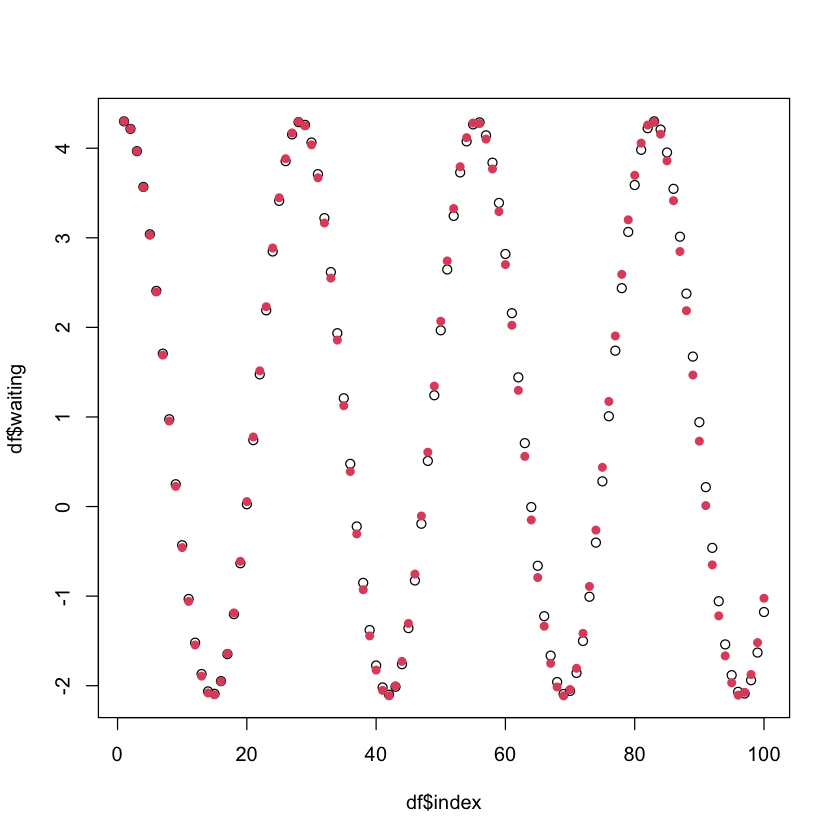

In [211]:
plot(df$index, df$waiting, col=1)
points(df$index, model(5.793e-02, 1.947, -1.000, df$waiting[1], df$waiting[2]), col=2, pch=16)

**This is why you get oscillations when you try to set the thermostat!**